## 环境信息

In [1]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

import torch
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("使用的设备：", torch.cuda.get_device_name(0))  # 获取第一个 CUDA 设备的名称
else:
    device = torch.device("cpu")
    print("CUDA 不可用，将使用 CPU。")

print("PyTorch 版本：", torch.__version__)
print("使用的设备类型：", device)
print("CUDA 版本：", torch.version.cuda)

2024-07-23 21:50:37.917367: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-23 21:50:38.034593: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-23 21:50:39.531074: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-23 21:50:39.540263: I tensorflow/comp

Num GPUs Available:  1
使用的设备： NVIDIA GeForce RTX 4090
PyTorch 版本： 1.11.0+cu113
使用的设备类型： cuda
CUDA 版本： 11.3


## 获取rollout

In [9]:
import os 
import sys
src_path = os.path.join(os.getcwd(), 'src')
if src_path not in sys.path:
    sys.path.append(src_path)

from data_modules.data_h5_womd import DataH5womd
import pl_modules.waymo_motion as waymo_motion_module

import torch
import pickle
import numpy as np

In [3]:
# 加载数据集
single_data = DataH5womd(
    data_dir = "data/h5_womd_sim_agent",
    filename_train = "training",
    filename_val = "validation",
    filename_test = "testing",
    n_agent = 64,
    batch_size = 4,
    num_workers = 4,
)
single_data.setup(stage="validate")
val_dataloader = single_data.val_dataloader()

In [4]:
CKPG_NAME = "2cti1q5z"
CKPG_VER = "v41"
# CKPG_NAME = "285yb3yb"
# CKPG_VER = "v59"

# 加载训练后的模型
ckpt_path = f"checkpoints/{CKPG_NAME}_{CKPG_VER}.ckpt"
checkpoint_version = f"yangyh408/traffic_bots/{CKPG_NAME}:{CKPG_VER}"
model = waymo_motion_module.WaymoMotion.load_from_checkpoint(
    ckpt_path, wb_artifact=checkpoint_version
)

/home/yangyh408/anaconda3/envs/traffic_sim_dl/lib/python3.9/site-packages/torch/distributed/_sharded_tensor/__init__.py:8: DeprecationWarning: torch.distributed._sharded_tensor will be deprecated, use torch.distributed._shard.sharded_tensor instead
  warnings.warn(


In [5]:
cur_scene_idx = 5

for batch_idx, batch in enumerate(val_dataloader):
    if cur_scene_idx in batch['episode_idx']:
        
        batch["scenario_bytes"] = []
        for scene_idx in batch['episode_idx']:
            with open(rf"data/h5_wosac/val_scenarios/{scene_idx}.pickle", "rb") as handle:
                batch["scenario_bytes"].append(pickle.load(handle).hex())
        
        model.eval()
        with torch.no_grad():
            rollout = model.manual_joint_future_pred(batch=batch, batch_idx=batch_idx)
        break

## 对仿真数据进行真实性特征提取

### 对rollout中的preds转换为全局坐标系

In [6]:
from utils.transform_utils import torch_pos2global, torch_rad2rot, torch_rad2global

# 转换为全局坐标系
trajs = rollout.preds.permute(0, 2, 1, 3, 4)

scenario_center = batch["scenario_center"].unsqueeze(1)  # [n_sc, 1, 2]
scenario_rot = torch_rad2rot(batch["scenario_yaw"])  # [n_sc, 2, 2]

pos_sim, yaw_sim = trajs[..., :2], trajs[..., 2:3]  # [n_sc, n_joint_future, n_ag, n_step_future, 2/1]
pos_sim = torch_pos2global(pos_sim.flatten(1, 3), scenario_center, scenario_rot).view(pos_sim.shape)
yaw_sim = torch_rad2global(yaw_sim.flatten(1, 4), batch["scenario_yaw"]).view(yaw_sim.shape)

agent_size = batch['agent/size'][..., :2]

### 提取出一个场景一次rollout的数据

In [7]:
si = 1  # batch中的场景编号 0-3
ri = 0  # rollout次数 0-31

agent_filter = tf.range(rollout.valid[si, :, ri, :].shape[0])[
    tf.reduce_sum(tf.cast(rollout.valid[si, :, ri, :], tf.int32), axis=-1) > 10].numpy()

object_id = batch['agent/object_id'][si][agent_filter]
center_x = pos_sim[si, ri, agent_filter, :, 0]
center_y = pos_sim[si, ri, agent_filter, :, 1]
length = tf.repeat(agent_size[si, agent_filter, 0, tf.newaxis], center_x.shape[1], axis=-1)
width = tf.repeat(agent_size[si, agent_filter, 1, tf.newaxis], center_x.shape[1], axis=-1)
heading = yaw_sim[si, ri, agent_filter, :, 0]
valid = rollout.valid[si, agent_filter, ri, :]

### 计算运动学相关参数

In [10]:
def central_diff(t: tf.Tensor, pad_value: float) -> tf.Tensor:
    # Prepare the tensor containing the value(s) to pad the result with.
    pad_shape = (*t.shape[:-1], 1)
    pad_tensor = tf.fill(pad_shape, pad_value)
    diff_t = (t[..., 2:] - t[..., :-2]) / 2
    return tf.concat([pad_tensor, diff_t, pad_tensor], axis=-1)

def _wrap_angle(angle: tf.Tensor) -> tf.Tensor:
    """Wraps angles in the range [-pi, pi]."""
    return (angle + np.pi) % (2 * np.pi) - np.pi

def compute_kinematic_features(
    x: tf.Tensor,
    y: tf.Tensor,
    heading: tf.Tensor,
    valid: tf.Tensor,
    seconds_per_step: float
):
    # 将不可用部分坐标和航向值设置为nan
    x = tf.where(valid, x, np.nan)
    y = tf.where(valid, y, np.nan)
    heading = tf.where(valid, heading, np.nan)
    
    # Linear speed and acceleration.
    dpos = central_diff(tf.stack([x, y], axis=0), pad_value=np.nan)
    linear_speed = tf.linalg.norm(
        dpos, ord='euclidean', axis=0) / seconds_per_step
    linear_accel = central_diff(linear_speed, pad_value=np.nan) / seconds_per_step
    dh_step = _wrap_angle(central_diff(heading, pad_value=np.nan) * 2) / 2
    dh = dh_step / seconds_per_step
    d2h_step = _wrap_angle(central_diff(dh_step, pad_value=np.nan) * 2) / 2
    d2h = d2h_step / (seconds_per_step**2)
    return linear_speed, linear_accel, dh, d2h

sim_kinematics = compute_kinematic_features(center_x, center_y, heading, valid, 0.1)
# np.nanmax(sim_kinematics[0].numpy(), axis=-1)

### 找到跟驰前车

In [11]:
boxes = tf.stack([center_x, center_y, length, width, heading, sim_kinematics[0]], axis=-1)
boxes = tf.transpose(boxes, perm=[1, 0, 2])
cur_valid = tf.transpose(valid, perm=[1, 0])

In [1]:
# 根据wosac每个场景指定的评价车辆进行筛选

# from waymo_open_dataset.utils.sim_agents import submission_specs

# evaluated_sim_agent_ids = tf.convert_to_tensor(
#     submission_specs.get_evaluation_sim_agent_ids(scenario)
# )
# evaluated_sim_agent_ids.shape
# evaluated_object_mask = tf.reduce_any(
#     # `evaluated_sim_agents` shape: (n_evaluated_objects,).
#     # `simulated_trajectories.object_id` shape: (n_objects,).
#     evaluated_sim_agent_ids[:, tf.newaxis]
#     == batch['agent/object_id'][si],
#     axis=0,
# )
# eval_boxes = tf.gather(boxes, tf.where(evaluated_object_mask)[:, 0], axis=1)

In [12]:
eval_boxes = boxes
ego_xy, ego_sizes, ego_yaw, ego_speed = tf.split(
    eval_boxes, num_or_size_splits=[2, 2, 1, 1], axis=-1
)
other_xy, other_sizes, other_yaw, _ = tf.split(
    boxes, num_or_size_splits=[2, 2, 1, 1], axis=-1
)

yaw_diff = tf.math.abs(other_yaw[:, tf.newaxis] - ego_yaw[:, :, tf.newaxis])
yaw_diff_cos = tf.math.cos(yaw_diff)
yaw_diff_sin = tf.math.sin(yaw_diff)

In [13]:
from waymo_open_dataset.utils import geometry_utils
# Longitudinal and lateral offsets from the other box center to its corner(s)
# closest to the ego box.

# 其余车辆在被查询车辆坐标系下的车身最大纵向长度投影
other_long_offset = geometry_utils.dot_product_2d(
    other_sizes[:, tf.newaxis] / 2.0,
    tf.math.abs(tf.concat([yaw_diff_cos, yaw_diff_sin], axis=-1)),
)
# 其余车辆在被查询车辆坐标系下的车身最大横向宽度投影
other_lat_offset = geometry_utils.dot_product_2d(
    other_sizes[:, tf.newaxis] / 2.0,
    tf.math.abs(tf.concat([yaw_diff_sin, yaw_diff_cos], axis=-1)),
)

# 将其余车辆的坐标转换到被查询车辆坐标系下
other_relative_xy = geometry_utils.rotate_2d_points(
    (other_xy[:, tf.newaxis] - ego_xy[:, :, tf.newaxis]),
    -ego_yaw,
)

# 纵向距离差异
long_distance = (
    other_relative_xy[..., 0]
    - ego_sizes[:, :, tf.newaxis, 0] / 2.0
    - other_long_offset
)

# 横向车身覆盖度，lat_overlap小于0说明该车与被查询车辆在横向有重叠
lat_overlap = (
    tf.math.abs(other_relative_xy[..., 1])
    - ego_sizes[:, :, tf.newaxis, 1] / 2.0
    - other_lat_offset
)

In [14]:
import math

# Constant distance to apply when distances between objects are invalid. This
# will avoid the propagation of nans and should be reduced out when taking the
# minimum anyway.
EXTREMELY_LARGE_DISTANCE = 1e10
# Collision threshold, i.e. largest distance between objects that is considered
# to be a collision.
COLLISION_DISTANCE_THRESHOLD = 0.0
# Rounding factor to apply to the corners of the object boxes in distance and
# collision computation. The rounding factor is between 0 and 1, where 0 yields
# rectangles with sharp corners (no rounding) and 1 yields capsule shapes.
# Default value of 0.7 conservately fits most vehicle contours.
CORNER_ROUNDING_FACTOR = 0.7

# Condition thresholds for filtering obstacles driving ahead of the ego pbject
# when computing the time-to-collision metric. This metric only considers
# collisions in lane-following a.k.a. tailgating situations.
# Maximum allowed difference in heading.
MAX_HEADING_DIFF = math.radians(75.0)  # radians.
# Maximum allowed difference in heading in case of small lateral overlap.
MAX_HEADING_DIFF_FOR_SMALL_OVERLAP = math.radians(10.0)  # radians.
# Lateral overlap threshold below which the tighter heading alignment condition
# `_MAX_HEADING_DIFF_FOR_SMALL_OVERLAP` is used.
SMALL_OVERLAP_THRESHOLD = 0.5  # meters.

# Maximum time-to-collision, in seconds, used to clip large values or in place
# of invalid values.
MAXIMUM_TIME_TO_COLLISION = 5.0

def _get_object_following_mask(
    longitudinal_distance: tf.Tensor,
    lateral_overlap: tf.Tensor,
    yaw_diff: tf.Tensor,
) -> tf.Tensor:
    """Checks whether objects satisfy criteria for following another object.

    An object on which the criteria are applied is called "ego object" in this
    function to disambiguate it from the other objects acting as obstacles.

    An "ego" object is considered to be following another object if they satisfy
    conditions on the longitudinal distance, lateral overlap, and yaw alignment
    between them.

    Args:
      longitudinal_distance: A float Tensor with shape (batch_dim, num_egos,
        num_others) containing longitudinal distances from the back side of each
        ego box to every other boxes.
      lateral_overlap: A float Tensor with shape (batch_dim, num_egos, num_others)
        containing lateral overlaps of other boxes over the trails of ego boxes.
      yaw_diff: A float Tensor with shape (batch_dim, num_egos, num_others)
        containing absolute yaw differences between egos and other boxes.

    Returns:
      A boolean Tensor with shape (batch_dim, num_egos, num_others) indicating for
      each ego box if it is following the other boxes.
    """

    # Check object is ahead of the ego box's front.
    valid_mask = longitudinal_distance > 0.0

    # Check alignment.
    valid_mask = tf.logical_and(valid_mask, yaw_diff <= MAX_HEADING_DIFF)

    # Check object is directly ahead of the ego box.
    valid_mask = tf.logical_and(valid_mask, lateral_overlap < 0.0)

    # Check strict alignment if the overlap is small.
    # `lateral_overlap` is a signed penetration distance: it is negative when the
    # boxes have an actual lateral overlap.
    return tf.logical_and(
        valid_mask,
        tf.logical_or(
            lateral_overlap < -SMALL_OVERLAP_THRESHOLD,
            yaw_diff <= MAX_HEADING_DIFF_FOR_SMALL_OVERLAP,
        ),
    )

following_mask = _get_object_following_mask(
    long_distance,
    lat_overlap,
    yaw_diff[..., 0],
  )

In [15]:
# Mask out boxes that are invalid or don't satisfy "following" conditions.
valid_mask = tf.logical_and(
    tf.repeat(cur_valid[..., tf.newaxis], cur_valid.shape[-1], axis=-1), 
    following_mask
)

# `masked_long_distance` shape: (num_steps, num_eval_objects, num_objects)
masked_long_distance = (
    long_distance
    + (1.0 - tf.cast(valid_mask, tf.float32)) * EXTREMELY_LARGE_DISTANCE
)

# `box_ahead_index` shape: (num_steps, num_evaluated_objects)
box_ahead_index = tf.math.argmin(masked_long_distance, axis=-1)
box_ahead_index[0]

<tf.Tensor: shape=(44,), dtype=int64, numpy=
array([ 6,  2,  0,  0,  0,  0,  0, 11,  0,  8, 12, 10,  0, 17,  0,  0,  0,
        0, 15,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 29,  0, 35,
        0,  0, 13,  0,  0,  0, 25, 26,  0, 37])>

In [19]:
mask_without_ahead_index = tf.reduce_all(masked_long_distance >= EXTREMELY_LARGE_DISTANCE, axis=-1)
nan_tensor = tf.fill(tf.shape(box_ahead_index), tf.constant(float('nan'), dtype=tf.float32)) 

# 有效的前车编号
valid_ahead_index = tf.where(mask_without_ahead_index, -1, box_ahead_index)
for i, j in enumerate(valid_ahead_index[0]):
    if j != -1:
        print(f"{i} -> {j}")

0 -> 6
1 -> 2
7 -> 11
9 -> 8
10 -> 12
11 -> 10
13 -> 17
17 -> 0
18 -> 15
31 -> 29
33 -> 35
36 -> 13
40 -> 25
41 -> 26
43 -> 37


### 计算与前车的相对信息

In [132]:
mask_without_ahead_index = tf.reduce_all(masked_long_distance >= EXTREMELY_LARGE_DISTANCE, axis=-1)
nan_tensor = tf.fill(tf.shape(box_ahead_index), tf.constant(float('nan'), dtype=tf.float32)) 

# 有效的前车编号
valid_ahead_index = tf.where(mask_without_ahead_index, -1, box_ahead_index)

# 与前车相对距离提取
distance_to_box_ahead = tf.gather(
    masked_long_distance, box_ahead_index, batch_dims=2
)
rel_distance = tf.where(mask_without_ahead_index, nan_tensor, distance_to_box_ahead)

# 与前车相对速度提取
speed_to_box_ahead = tf.gather(
    tf.broadcast_to(
        tf.transpose(
            sim_kinematics[0][
                :,
                tf.newaxis,
                :,
            ]
        ),
        masked_long_distance.shape,
    ),
    box_ahead_index,
    batch_dims=2,
)
speed_to_box_ahead = tf.where(mask_without_ahead_index, nan_tensor, speed_to_box_ahead)
rel_speed = ego_speed[..., 0] - speed_to_box_ahead

# 与前车相对加速度提取
acc_to_box_ahead = tf.gather(
    tf.broadcast_to(
        tf.transpose(
            sim_kinematics[1][
                :,
                tf.newaxis,
                :,
            ]
        ),
        masked_long_distance.shape,
    ),
    box_ahead_index,
    batch_dims=2,
)
acc_to_box_ahead = tf.where(mask_without_ahead_index, nan_tensor, acc_to_box_ahead)
rel_acc = tf.transpose(sim_kinematics[1]) - acc_to_box_ahead

# TTC计算
time_to_collision = rel_distance / rel_speed

In [134]:
rel_speed[2]

<tf.Tensor: shape=(44,), dtype=float32, numpy=
array([ 0.        , -1.9833875 ,         nan,         nan,         nan,
               nan,         nan,  0.        ,         nan,  0.        ,
        0.        ,  0.        ,         nan,  0.        ,         nan,
               nan, -2.215273  ,  0.        , -0.19556999,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,  0.09499549,         nan, -0.89666605,         nan,
               nan,  4.004337  ,         nan,         nan,         nan,
        0.        ,  1.7997673 ,         nan,  6.1755056 ], dtype=float32)>

## 计算一个场景的所有真实性相关特征

In [64]:
import dataclasses
import tensorflow_probability as tfp
import matplotlib.pyplot as plt  
from scipy.spatial.distance import jensenshannon
from scipy.stats import entropy
from sklearn.neighbors import KernelDensity

@dataclasses.dataclass(frozen=True)
class MetricFeatures:
    linear_accel: tf.Tensor
    linear_speed: tf.Tensor
    yaw_speed: tf.Tensor
    yaw_accel: tf.Tensor
    relative_distance: tf.Tensor
    relative_speed: tf.Tensor
    relative_accel: tf.Tensor
    ttc: tf.Tensor

class RealMetrics:
    def __init__(self):
        self.log_features = None
        self.sim_features = []
        self.config = {
            'linear_speed': {
                'min_val': 0.0,
                'max_val': 25.0,
                'num_bins': 10,
                'bar_width': 1,
            },
            'linear_accel': {
                'min_val': -12.0,
                'max_val': 12.0,
                'num_bins': 11,
                'bar_width': 1,
            },
            'yaw_speed': {
                'min_val': -0.628000020980835,
                'max_val': 0.628000020980835,
                'num_bins': 11,
                'bar_width': 0.05,
            },
            'yaw_accel': {
                'min_val': -3.140000104904175,
                'max_val': 3.140000104904175,
                'num_bins': 11,
                'bar_width': 0.2,
            },
            'relative_distance': {
                'min_val': 0.0,
                'max_val': 50.0,
                'num_bins': 10,
                'bar_width': 2,
            },
            'relative_speed': {
                'min_val': -25.0,
                'max_val': 25.0,
                'num_bins': 20,
                'bar_width': 1,
            },
            'relative_accel': {
                'min_val': -12.0,
                'max_val': 12.0,
                'num_bins': 11,
                'bar_width': 1,
            },
            'ttc': {
                'min_val': 0.0,
                'max_val': 5.0,
                'num_bins': 10,
                'bar_width': 0.2,
            },
        }
        self.js_divergence = {field.name: None for field in dataclasses.fields(MetricFeatures)}  
    
    def add_log_features(self, metric_feature):
        self.log_features = metric_feature

    def add_sim_features(self, metric_feature):
        self.sim_features.append(metric_feature)

    def save(self, filename):  
        with open(filename, 'wb') as file:  
            pickle.dump(self, file)  
  
    @staticmethod  
    def load(filename):  
        # 使用with语句确保文件正确关闭  
        with open(filename, 'rb') as file:  
            obj = pickle.load(file)  
            if isinstance(obj, RealMetrics):  
                return obj  
            else:  
                raise TypeError("Loaded object is not an instance of RealMetrics")  
            
    def cal_JS_with_histogram(self, field, log_feature, sim_feature, *, plot=False):
        edges = tf.cast(tf.linspace(
            self.config[field]['min_val'], self.config[field]['max_val'], self.config[field]['num_bins']+1), tf.float32)

        log_feature = tf.clip_by_value(
            log_feature, self.config[field]['min_val'], self.config[field]['max_val'])
        sim_feature = tf.clip_by_value(
            sim_feature, self.config[field]['min_val'], self.config[field]['max_val'])

        sim_counts = tfp.stats.histogram(sim_feature, edges)
        sim_counts /= tf.reduce_sum(sim_counts)
        log_counts = tfp.stats.histogram(log_feature, edges)
        log_counts /= tf.reduce_sum(log_counts)

        js_divergence = jensenshannon(sim_counts, log_counts) ** 2

        if plot:
            print(f"JS({field}) = {js_divergence}") 
            plt.bar(edges[:-1]+0.5*self.config[field]['bar_width'], sim_counts, align='center', width=self.config[field]['bar_width'], alpha=0.5, label="sim_info")
            plt.bar(edges[:-1]-0.5*self.config[field]['bar_width'], log_counts, align='center', width=self.config[field]['bar_width'], alpha=0.5, label="log_info")
            
            plt.title(f"{field} Distribution Probabilities")
            plt.legend()
            plt.show()
            print("-"*50 + '\n') 
        
        return js_divergence

    def _KDE_density(feature, min_val, max_val):
        eps = 1e-6
        h_bandwidth = 1.06 * np.std(feature) * feature.shape[0] ** (-1/5)
        kde = KernelDensity(
            kernel="gaussian", 
            bandwidth=h_bandwidth, 
            algorithm="auto"
        ).fit(feature[:, tf.newaxis] + eps)
        x_ax = np.linspace(min_val, max_val, 5000).reshape(-1, 1)
        log_density = kde.score_samples(x_ax).reshape(-1, 1)
        density_results = np.exp(log_density).reshape(-1, 1)
        return x_ax, density_results

    def cal_JS_with_kernal(self, field, log_feature, sim_feature, *, plot=False):
        log_feature = tf.clip_by_value(
            log_feature, self.config[field]['min_val'], self.config[field]['max_val'])
        sim_feature = tf.clip_by_value(
            sim_feature, self.config[field]['min_val'], self.config[field]['max_val'])
        
        x_a_preds, ds_preds = self._KDE_density(sim_feature, self.config[field]['min_val'], self.config[field]['max_val'])
        x_a_log, ds_log = self._KDE_density(log_feature, self.config[field]['min_val'], self.config[field]['max_val'])

        m = (ds_preds + ds_log) / 2.0
        
        KL_preds_m = entropy(ds_preds, m)
        KL_log_m = entropy(ds_log, m)

        js_divergence = ((KL_log_m + KL_preds_m) / 2.0)[0]

        if plot:
            print(f"JS({field}) = {js_divergence}") 
            plt.plot(x_a_preds.ravel(), ds_preds.ravel(), label="sim_info")  
            plt.fill_between(x_a_preds.ravel(), ds_preds.ravel(), alpha=0.5)  
            plt.plot(x_a_log.ravel(), ds_log.ravel(), label="log_info")  
            plt.fill_between(x_a_log.ravel(), ds_log.ravel(), alpha=0.5)  

            plt.title(f"{field} Kernel Density Estimate")
            plt.legend()
            plt.show()
            print("-"*50 + '\n') 
        
        return js_divergence
    
    def compute_js_divergence(self, *, method: str="histogram", plot: bool=False):
        for field in self.js_divergence.keys():
            log_field_feature = getattr(real_metrics.log_features, field).numpy().reshape(-1)
            log_field_feature = log_field_feature[~np.isnan(log_field_feature)]

            sim_field_feature = np.concatenate(
                [getattr(sim_feature, field).numpy() for sim_feature in real_metrics.sim_features]
            ).reshape(-1)
            sim_field_feature = sim_field_feature[~np.isnan(sim_field_feature)]

            if method == "histogram":
                self.js_divergence[field] = self.cal_JS_with_histogram(field, log_field_feature, sim_field_feature, plot=plot)
            elif method == "kernel":
                self.js_divergence[field] = self.cal_JS_with_kernal(field, log_field_feature, sim_field_feature, plot=plot)
            else:
                raise RuntimeError("Unkown method for compute_js_divergence, please use 'histogram' or 'kernel'!")
  

In [57]:
import math
from waymo_open_dataset.utils import geometry_utils

# Constant distance to apply when distances between objects are invalid. This
# will avoid the propagation of nans and should be reduced out when taking the
# minimum anyway.
EXTREMELY_LARGE_DISTANCE = 1e10
# Collision threshold, i.e. largest distance between objects that is considered
# to be a collision.
COLLISION_DISTANCE_THRESHOLD = 0.0
# Rounding factor to apply to the corners of the object boxes in distance and
# collision computation. The rounding factor is between 0 and 1, where 0 yields
# rectangles with sharp corners (no rounding) and 1 yields capsule shapes.
# Default value of 0.7 conservately fits most vehicle contours.
CORNER_ROUNDING_FACTOR = 0.7

# Condition thresholds for filtering obstacles driving ahead of the ego pbject
# when computing the time-to-collision metric. This metric only considers
# collisions in lane-following a.k.a. tailgating situations.
# Maximum allowed difference in heading.
MAX_HEADING_DIFF = math.radians(75.0)  # radians.
# Maximum allowed difference in heading in case of small lateral overlap.
MAX_HEADING_DIFF_FOR_SMALL_OVERLAP = math.radians(10.0)  # radians.
# Lateral overlap threshold below which the tighter heading alignment condition
# `_MAX_HEADING_DIFF_FOR_SMALL_OVERLAP` is used.
SMALL_OVERLAP_THRESHOLD = 0.5  # meters.

# Maximum time-to-collision, in seconds, used to clip large values or in place
# of invalid values.
MAXIMUM_TIME_TO_COLLISION = 5.0

def _central_diff(t: tf.Tensor, pad_value: float) -> tf.Tensor:
    # Prepare the tensor containing the value(s) to pad the result with.
    pad_shape = (*t.shape[:-1], 1)
    pad_tensor = tf.fill(pad_shape, pad_value)
    diff_t = (t[..., 2:] - t[..., :-2]) / 2
    return tf.concat([pad_tensor, diff_t, pad_tensor], axis=-1)

def _wrap_angle(angle: tf.Tensor) -> tf.Tensor:
    """Wraps angles in the range [-pi, pi]."""
    return (angle + np.pi) % (2 * np.pi) - np.pi

def compute_kinematic_features(
    x: tf.Tensor,
    y: tf.Tensor,
    heading: tf.Tensor,
    valid: tf.Tensor,
    seconds_per_step: float
):
    # 将不可用部分坐标和航向值设置为nan
    x = tf.where(valid, x, np.nan)
    y = tf.where(valid, y, np.nan)
    heading = tf.where(valid, heading, np.nan)
    
    # Linear speed and acceleration.
    dpos = _central_diff(tf.stack([x, y], axis=0), pad_value=np.nan)
    linear_speed = tf.linalg.norm(
        dpos, ord='euclidean', axis=0) / seconds_per_step
    linear_accel = _central_diff(linear_speed, pad_value=np.nan) / seconds_per_step
    dh_step = _wrap_angle(_central_diff(heading, pad_value=np.nan) * 2) / 2
    dh = dh_step / seconds_per_step
    d2h_step = _wrap_angle(_central_diff(dh_step, pad_value=np.nan) * 2) / 2
    d2h = d2h_step / (seconds_per_step**2)
    return linear_speed, linear_accel, dh, d2h

def _get_object_following_mask(
    longitudinal_distance: tf.Tensor,
    lateral_overlap: tf.Tensor,
    yaw_diff: tf.Tensor,
) -> tf.Tensor:
    # Check object is ahead of the ego box's front.
    valid_mask = longitudinal_distance > 0.0

    # Check alignment.
    valid_mask = tf.logical_and(valid_mask, yaw_diff <= MAX_HEADING_DIFF)

    # Check object is directly ahead of the ego box.
    valid_mask = tf.logical_and(valid_mask, lateral_overlap < 0.0)

    # Check strict alignment if the overlap is small.
    # `lateral_overlap` is a signed penetration distance: it is negative when the
    # boxes have an actual lateral overlap.
    return tf.logical_and(
        valid_mask,
        tf.logical_or(
            lateral_overlap < -SMALL_OVERLAP_THRESHOLD,
            yaw_diff <= MAX_HEADING_DIFF_FOR_SMALL_OVERLAP,
        ),
    )

def find_ahead_index(
        boxes: tf.Tensor,
        valid: tf.Tensor
):
    eval_boxes = boxes
    ego_xy, ego_sizes, ego_yaw, ego_speed = tf.split(
        eval_boxes, num_or_size_splits=[2, 2, 1, 1], axis=-1
    )
    other_xy, other_sizes, other_yaw, _ = tf.split(
        boxes, num_or_size_splits=[2, 2, 1, 1], axis=-1
    )

    yaw_diff = tf.math.abs(other_yaw[:, tf.newaxis] - ego_yaw[:, :, tf.newaxis])
    yaw_diff_cos = tf.math.cos(yaw_diff)
    yaw_diff_sin = tf.math.sin(yaw_diff)

    # 其余车辆在被查询车辆坐标系下的车身最大纵向长度投影
    other_long_offset = geometry_utils.dot_product_2d(
        other_sizes[:, tf.newaxis] / 2.0,
        tf.math.abs(tf.concat([yaw_diff_cos, yaw_diff_sin], axis=-1)),
    )
    # 其余车辆在被查询车辆坐标系下的车身最大横向宽度投影
    other_lat_offset = geometry_utils.dot_product_2d(
        other_sizes[:, tf.newaxis] / 2.0,
        tf.math.abs(tf.concat([yaw_diff_sin, yaw_diff_cos], axis=-1)),
    )

    # 将其余车辆的坐标转换到被查询车辆坐标系下
    other_relative_xy = geometry_utils.rotate_2d_points(
        (other_xy[:, tf.newaxis] - ego_xy[:, :, tf.newaxis]),
        -ego_yaw,
    )

    # 纵向距离差异
    long_distance = (
        other_relative_xy[..., 0]
        - ego_sizes[:, :, tf.newaxis, 0] / 2.0
        - other_long_offset
    )

    # 横向车身覆盖度，lat_overlap小于0说明该车与被查询车辆在横向有重叠
    lat_overlap = (
        tf.math.abs(other_relative_xy[..., 1])
        - ego_sizes[:, :, tf.newaxis, 1] / 2.0
        - other_lat_offset
    )
    
    following_mask = _get_object_following_mask(
        long_distance,
        lat_overlap,
        yaw_diff[..., 0],
    )

    # Mask out boxes that are invalid or don't satisfy "following" conditions.
    valid_mask = tf.logical_and(
        tf.repeat(valid[..., tf.newaxis], valid.shape[-1], axis=-1), 
        following_mask
    )

    # `masked_long_distance` shape: (num_steps, num_eval_objects, num_objects)
    masked_long_distance = (
        long_distance
        + (1.0 - tf.cast(valid_mask, tf.float32)) * EXTREMELY_LARGE_DISTANCE
    )

    # `box_ahead_index` shape: (num_steps, num_evaluated_objects)
    box_ahead_index = tf.math.argmin(masked_long_distance, axis=-1)

    return masked_long_distance, box_ahead_index


def compute_real_metric_features(
        center_x: tf.Tensor,
        center_y: tf.Tensor,
        length: tf.Tensor,
        width: tf.Tensor,
        heading: tf.Tensor,
        valid: tf.Tensor,
):
    linear_speed, linear_accel, yaw_speed, yaw_accel = compute_kinematic_features(center_x, center_y, heading, valid, 0.1)

    boxes = tf.stack([center_x, center_y, length, width, heading, linear_speed], axis=-1)
    masked_long_distance, box_ahead_index = find_ahead_index(
        tf.transpose(boxes, perm=[1, 0, 2]),
        tf.transpose(valid, perm=[1, 0])
    )
    
    mask_without_ahead_index = tf.reduce_all(masked_long_distance >= EXTREMELY_LARGE_DISTANCE, axis=-1)
    nan_tensor = tf.fill(tf.shape(box_ahead_index), tf.constant(float('nan'), dtype=tf.float32)) 

    # 有效的前车编号
    valid_ahead_index = tf.where(mask_without_ahead_index, -1, box_ahead_index)

    # 与前车相对距离提取
    distance_to_box_ahead = tf.gather(
        masked_long_distance, box_ahead_index, batch_dims=2
    )
    rel_distance = tf.where(mask_without_ahead_index, nan_tensor, distance_to_box_ahead)

    # 与前车相对速度提取
    speed_to_box_ahead = tf.gather(
        tf.broadcast_to(
            tf.transpose(
                linear_speed[
                    :,
                    tf.newaxis,
                    :,
                ]
            ),
            masked_long_distance.shape,
        ),
        box_ahead_index,
        batch_dims=2,
    )
    speed_to_box_ahead = tf.where(mask_without_ahead_index, nan_tensor, speed_to_box_ahead)
    rel_speed = tf.transpose(linear_speed) - speed_to_box_ahead

    # 与前车相对加速度提取
    acc_to_box_ahead = tf.gather(
        tf.broadcast_to(
            tf.transpose(
                linear_accel[
                    :,
                    tf.newaxis,
                    :,
                ]
            ),
            masked_long_distance.shape,
        ),
        box_ahead_index,
        batch_dims=2,
    )
    acc_to_box_ahead = tf.where(mask_without_ahead_index, nan_tensor, acc_to_box_ahead)
    rel_acc = tf.transpose(linear_accel) - acc_to_box_ahead

    # TTC计算
    time_to_collision = tf.where(
        tf.logical_and(~np.isnan(rel_speed), rel_speed < 0.0),
        MAXIMUM_TIME_TO_COLLISION,
        rel_distance / rel_speed,
    )
    
    return MetricFeatures(
        linear_accel = linear_accel,
        linear_speed = linear_speed,
        yaw_speed = yaw_speed,
        yaw_accel = yaw_accel,
        relative_distance = tf.transpose(rel_distance),
        relative_speed = tf.transpose(rel_speed),
        relative_accel = tf.transpose(rel_acc),
        ttc = tf.transpose(time_to_collision)
    )



In [71]:
import numpy as np
from waymo_open_dataset.protos import scenario_pb2
from waymo_open_dataset.utils import trajectory_utils
from utils.transform_utils import torch_pos2global, torch_rad2rot, torch_rad2global

pkl_dir = "/home/gz0779601/codes/DataDriven_BehaviourModels/deep_learning_model/v1.0/outputs/real_metrics_2cti1q5z_v41"

# 转换为全局坐标系
trajs = rollout.preds.permute(0, 2, 1, 3, 4)

scenario_center = batch["scenario_center"].unsqueeze(1)  # [n_sc, 1, 2]
scenario_rot = torch_rad2rot(batch["scenario_yaw"])  # [n_sc, 2, 2]

pos_sim, yaw_sim = trajs[..., :2], trajs[..., 2:3]  # [n_sc, n_joint_future, n_ag, n_step_future, 2/1]
pos_sim = torch_pos2global(pos_sim.flatten(1, 3), scenario_center, scenario_rot).view(pos_sim.shape)
yaw_sim = torch_rad2global(yaw_sim.flatten(1, 4), batch["scenario_yaw"]).view(yaw_sim.shape)
agent_size = batch['agent/size'][..., :2]

for si in range(trajs.shape[0]):
    real_metrics = RealMetrics()

    agent_filter = tf.range(rollout.valid[si, :, 0, :].shape[0])[
                tf.reduce_sum(tf.cast(rollout.valid[si, :, 0, :], tf.int32), axis=-1) > 10].numpy()
    object_id = batch['agent/object_id'][si][agent_filter]
    
    # 计算回放轨迹的真实指标特征
    origin_scenario = scenario_pb2.Scenario.FromString(bytes.fromhex(batch['scenario_bytes'][si]))
    logged_trajectories = trajectory_utils.ObjectTrajectories.from_scenario(origin_scenario)
    logged_trajectories = logged_trajectories.gather_objects_by_id(object_id)
    logged_trajectories = logged_trajectories.slice_time(start_index=1)

    real_metrics.add_log_features(compute_real_metric_features(
        logged_trajectories.x, 
        logged_trajectories.y, 
        logged_trajectories.length, 
        logged_trajectories.width, 
        logged_trajectories.heading, 
        logged_trajectories.valid
    ))

    # 计算每一个仿真rollout的真实指标特征
    length = tf.repeat(agent_size[si, agent_filter, 0, tf.newaxis], trajs.shape[-2], axis=-1)
    width = tf.repeat(agent_size[si, agent_filter, 1, tf.newaxis], trajs.shape[-2], axis=-1)
    for ri in range(trajs.shape[1]):
        center_x = pos_sim[si, ri, agent_filter, :, 0]
        center_y = pos_sim[si, ri, agent_filter, :, 1]
        heading = yaw_sim[si, ri, agent_filter, :, 0]
        valid = rollout.valid[si, agent_filter, ri, :]
        
        real_metrics.add_sim_features(
            compute_real_metric_features(center_x, center_y, length, width, heading, valid))
    
    real_metrics.compute_js_divergence()
    # 保存单场景真实性指标
    real_metrics.save(os.path.join(pkl_dir, f"scene_{batch['episode_idx'][si]}.pkl"))
        

In [68]:
# 保存单场景真实性指标
real_metrics.save(f"/home/gz0779601/codes/DataDriven_BehaviourModels/deep_learning_model/v1.0/outputs/real_metrics_2cti1q5z_v41/scene_{batch['episode_idx'][si]}.pkl")

In [76]:
from models.metrics.custom_metrics import RealMetrics
# 加载单场景真实性指标
real_metrics = RealMetrics.load("/home/gz0779601/codes/DataDriven_BehaviourModels/deep_learning_model/v1.0/outputs/real_metrics_2cti1q5z_v41/scene_5.pkl")

### 计算单场景指标的JS散度

In [62]:
config = {
    'linear_speed': {
        'min_val': 0.0,
        'max_val': 25.0,
        'num_bins': 10,
        'bar_width': 1,
    },
    'linear_accel': {
        'min_val': -12.0,
        'max_val': 12.0,
        'num_bins': 11,
        'bar_width': 1,
    },
    'yaw_speed': {
        'min_val': -0.628000020980835,
        'max_val': 0.628000020980835,
        'num_bins': 11,
        'bar_width': 0.05,
    },
    'yaw_accel': {
        'min_val': -3.140000104904175,
        'max_val': 3.140000104904175,
        'num_bins': 11,
        'bar_width': 0.2,
    },
    'relative_distance': {
        'min_val': 0.0,
        'max_val': 50.0,
        'num_bins': 10,
        'bar_width': 2,
    },
    'relative_speed': {
        'min_val': -25.0,
        'max_val': 25.0,
        'num_bins': 20,
        'bar_width': 1,
    },
    'relative_accel': {
        'min_val': -12.0,
        'max_val': 12.0,
        'num_bins': 11,
        'bar_width': 1,
    },
    'ttc': {
        'min_val': 0.0,
        'max_val': 5.0,
        'num_bins': 10,
        'bar_width': 0.2,
    },
}

JS(linear_accel) = 0.012139009311795235


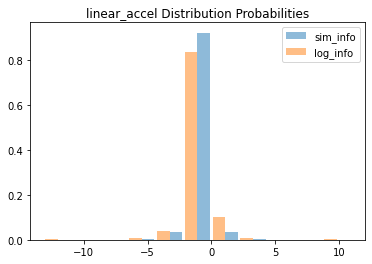

--------------------------------------------------

JS(linear_accel) = 0.0862131212008983


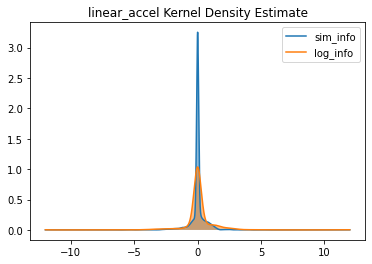

--------------------------------------------------

JS(linear_speed) = 0.004644551314413548


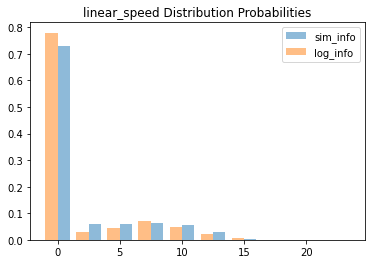

--------------------------------------------------

JS(linear_speed) = 0.024512051704387965


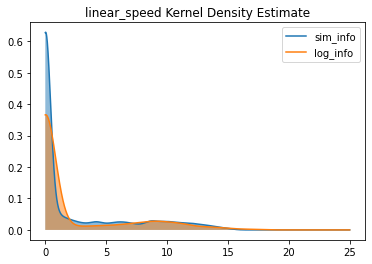

--------------------------------------------------

JS(yaw_speed) = 0.00715332105755806


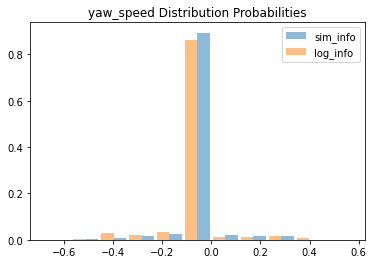

--------------------------------------------------

JS(yaw_speed) = 0.09508908930904264


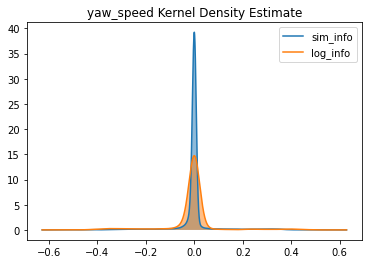

--------------------------------------------------

JS(yaw_accel) = 0.004905145149677991


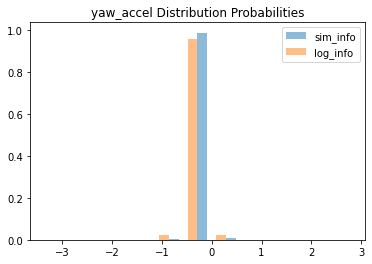

--------------------------------------------------

JS(yaw_accel) = 0.18289643145396145


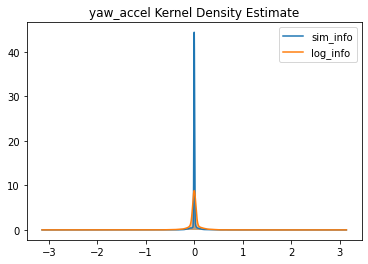

--------------------------------------------------

JS(relative_distance) = 0.18374770879745483


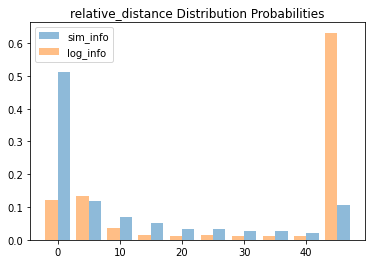

--------------------------------------------------

JS(relative_distance) = 0.13854301112630377


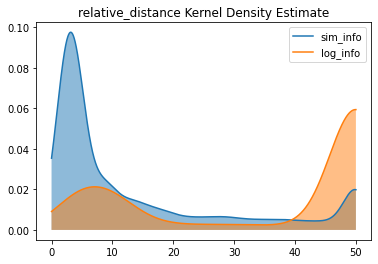

--------------------------------------------------

JS(relative_speed) = 0.01459201704710722


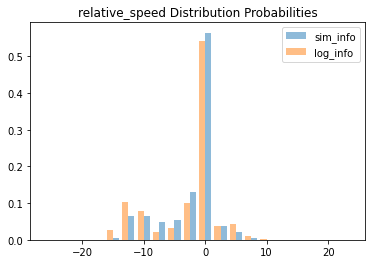

--------------------------------------------------

JS(relative_speed) = 0.05470216643482525


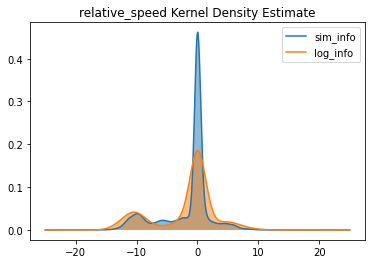

--------------------------------------------------

JS(relative_accel) = 0.023163519799709317


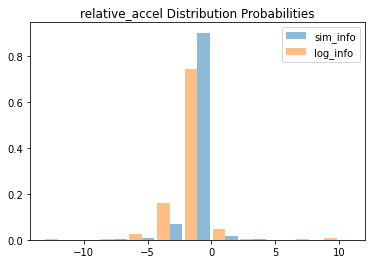

--------------------------------------------------

JS(relative_accel) = 0.09327167746315557


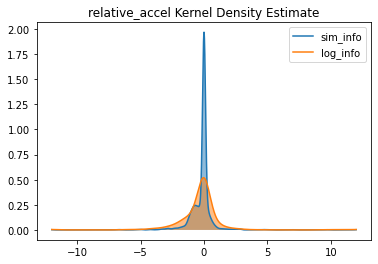

--------------------------------------------------

JS(ttc) = 0.007386196404695511


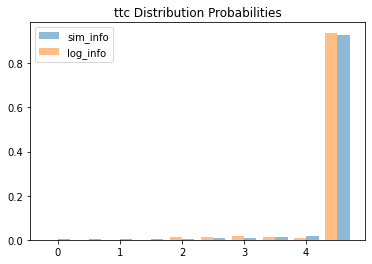

--------------------------------------------------

JS(ttc) = 0.042162975418063124


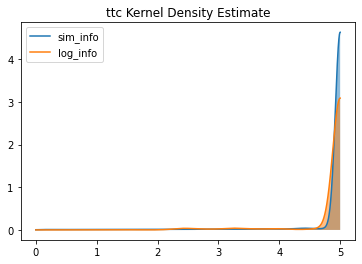

--------------------------------------------------



In [63]:
import tensorflow_probability as tfp
import matplotlib.pyplot as plt  
from scipy.spatial.distance import jensenshannon
from scipy.stats import entropy
from sklearn.neighbors import KernelDensity

def cal_JS_with_histogram(field, log_feature, sim_feature, *, plot=False):
    edges = tf.cast(tf.linspace(
        config[field]['min_val'], config[field]['max_val'], config[field]['num_bins']+1), tf.float32)

    log_feature = tf.clip_by_value(
        log_feature, config[field]['min_val'], config[field]['max_val'])
    sim_feature = tf.clip_by_value(
        sim_feature, config[field]['min_val'], config[field]['max_val'])

    sim_counts = tfp.stats.histogram(sim_feature, edges)
    sim_counts /= tf.reduce_sum(sim_counts)
    log_counts = tfp.stats.histogram(log_feature, edges)
    log_counts /= tf.reduce_sum(log_counts)

    js_divergence = jensenshannon(sim_counts, log_counts) ** 2

    if plot:
        print(f"JS({field}) = {js_divergence}") 
        plt.bar(edges[:-1]+0.5*config[field]['bar_width'], sim_counts, align='center', width=config[field]['bar_width'], alpha=0.5, label="sim_info")
        plt.bar(edges[:-1]-0.5*config[field]['bar_width'], log_counts, align='center', width=config[field]['bar_width'], alpha=0.5, label="log_info")
        
        plt.title(f"{field} Distribution Probabilities")
        plt.legend()
        plt.show()
        print("-"*50 + '\n') 
    
    return js_divergence

def _KDE_density(feature, min_val, max_val):
    eps = 1e-6
    h_bandwidth = 1.06 * np.std(feature) * feature.shape[0] ** (-1/5)
    kde = KernelDensity(
        kernel="gaussian", 
        bandwidth=h_bandwidth, 
        algorithm="auto"
    ).fit(feature[:, tf.newaxis] + eps)
    x_ax = np.linspace(min_val, max_val, 5000).reshape(-1, 1)
    log_density = kde.score_samples(x_ax).reshape(-1, 1)
    density_results = np.exp(log_density).reshape(-1, 1)
    return x_ax, density_results

def cal_JS_with_kernal(field, log_feature, sim_feature, *, plot=False):
    log_feature = tf.clip_by_value(
        log_feature, config[field]['min_val'], config[field]['max_val'])
    sim_feature = tf.clip_by_value(
        sim_feature, config[field]['min_val'], config[field]['max_val'])
    
    x_a_preds, ds_preds = _KDE_density(sim_feature, config[field]['min_val'], config[field]['max_val'])
    x_a_log, ds_log = _KDE_density(log_feature, config[field]['min_val'], config[field]['max_val'])

    m = (ds_preds + ds_log) / 2.0
    
    KL_preds_m = entropy(ds_preds, m)
    KL_log_m = entropy(ds_log, m)

    js_divergence = ((KL_log_m + KL_preds_m) / 2.0)[0]

    if plot:
        print(f"JS({field}) = {js_divergence}") 
        plt.plot(x_a_preds.ravel(), ds_preds.ravel(), label="sim_info")  
        plt.fill_between(x_a_preds.ravel(), ds_preds.ravel(), alpha=0.5)  
        plt.plot(x_a_log.ravel(), ds_log.ravel(), label="log_info")  
        plt.fill_between(x_a_log.ravel(), ds_log.ravel(), alpha=0.5)  

        plt.title(f"{field} Kernel Density Estimate")
        plt.legend()
        plt.show()
        print("-"*50 + '\n') 
    
    return js_divergence

features_fields = [field.name for field in dataclasses.fields(MetricFeatures)]
for field in features_fields:
    log_field_feature = getattr(real_metrics.log_features, field).numpy().reshape(-1)
    log_field_feature = log_field_feature[~np.isnan(log_field_feature)]

    sim_field_feature = np.concatenate(
        [getattr(sim_feature, field).numpy() for sim_feature in real_metrics.sim_features]
    ).reshape(-1)
    sim_field_feature = sim_field_feature[~np.isnan(sim_field_feature)]

    cal_JS_with_histogram(field, log_field_feature, sim_field_feature, plot=True)

    cal_JS_with_kernal(field, log_field_feature, sim_field_feature, plot=True)


## 可视化场景

In [310]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation  
import numpy as np
from waymo_open_dataset.utils.sim_agents import visualizations

# Set matplotlib to jshtml so animations work with colab.
from matplotlib import rc
rc('animation', html='jshtml')

### 绘制原始场景及轨迹

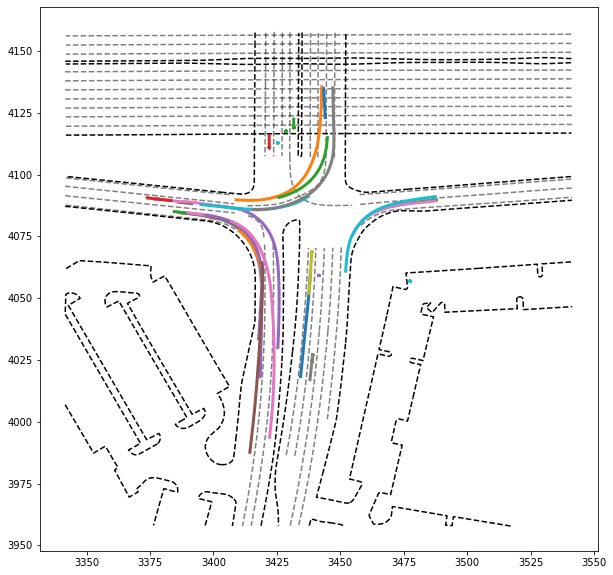

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Visualize static map.
visualizations.add_map(ax, scenario)

# Visualize agent trajectory
def plot_track_trajectory(track: scenario_pb2.Track) -> None:
    valids = np.array([state.valid for state in track.states])
    if np.any(valids):
        x = np.array([state.center_x for state in track.states])
        y = np.array([state.center_y for state in track.states])
        ax.plot(x[valids], y[valids], linewidth=3)
for track in scenario.tracks:
    plot_track_trajectory(track)

plt.show()


### 绘制仿真动画

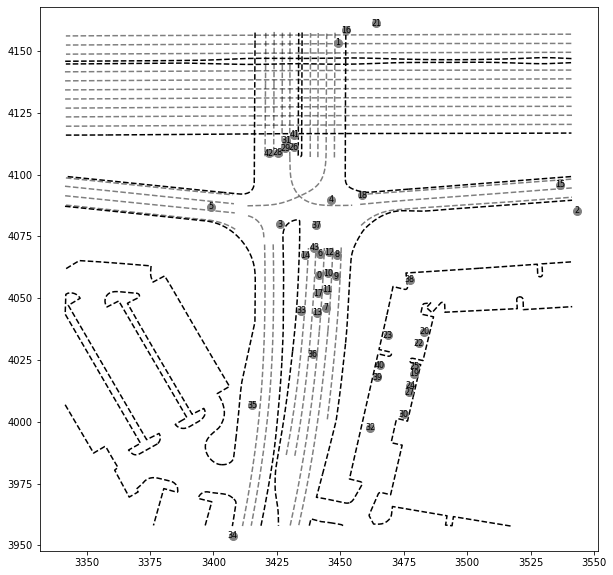

In [400]:
# 绘制仿真生成场景

WAYMO_COLORS = np.array([
    [0., 120., 255.],    # Waymo Blue
    [0., 232., 157.],    # Waymo Green
    [255., 205., 85.],   # Amber
    [244., 175., 145.],  # Coral
    [145., 80., 200.],   # Purple
    [0., 51., 102.],     # Navy
]) / 255.


fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Visualize static map.
visualizations.add_map(ax, scenario)

# 初始化plot对象，以便在动画中更新  
agents = []
texts = []
for agent_num in range(center_x.shape[0]):  
    agents.append(ax.plot([], [], 'o', markersize=8, c='grey')[0])  
    texts.append(ax.text(0, 0, str(agent_num), ha='center', va='center', fontsize=8, color='black'))
  
# 更新动画的函数  
def update(timestep):

    for agent_num, (agent, text) in enumerate(zip(agents, texts)): 
        if valid[agent_num, timestep]: 
            agent.set_data(center_x[agent_num, timestep], center_y[agent_num, timestep]) 
            # agent.set_color("red")
            text.set_position((center_x[agent_num, timestep], center_y[agent_num, timestep]))  
    return agents  
  
# 创建动画  
ani = FuncAnimation(fig, update, frames=range(center_x.shape[1]), blit=True)  
  
# 显示动画  
ani

## 批量分析计算的真实性相关数据

In [1]:
import os 
import sys
src_path = os.path.join(os.getcwd(), 'src')
if src_path not in sys.path:
    sys.path.append(src_path)

from pathlib import Path
from tqdm import trange
import pickle
import numpy as np
import tensorflow as tf
import dataclasses

from models.metrics.custom_metrics import MetricFeatures

METRIC_DIR = Path("/home/yangyh408/codes/DataDriven_BehaviourModels/deep_learning_model/v1.0/outputs/real_metrics_2cti1q5z_v41")

log_field_features = {field.name: [] for field in dataclasses.fields(MetricFeatures)}  
sim_field_features = {field.name: [] for field in dataclasses.fields(MetricFeatures)}  

for i in trange(350):
    pkl_path = METRIC_DIR/f"scene_{i}.pkl"
    if os.path.exists(pkl_path):
        with open(pkl_path, 'rb') as file:  
            obj = pickle.load(file)  

            for field in obj.js_divergence.keys():
                log_field_feature = getattr(obj.log_features, field).numpy().reshape(-1)
                log_field_feature = log_field_feature[~np.isnan(log_field_feature)]
                log_field_features[field].extend(log_field_feature)

                sim_field_feature = np.concatenate(
                    [getattr(sim_feature, field).numpy() for sim_feature in obj.sim_features]
                ).reshape(-1)
                sim_field_feature = sim_field_feature[~np.isnan(sim_field_feature)]
                sim_field_features[field].extend(sim_field_feature)
    else:
        print(f"File scene_{i}.pkl Not Found!")



2024-07-24 18:49:32.003826: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-24 18:49:32.025711: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
  0%|          | 0/350 [00:00<?, ?it/s]2024-07-24 18:49:33.250970: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-0

File scene_344.pkl Not Found!
File scene_345.pkl Not Found!
File scene_346.pkl Not Found!
File scene_347.pkl Not Found!
File scene_348.pkl Not Found!
File scene_349.pkl Not Found!


JS(linear_accel) = 0.21342202455819945


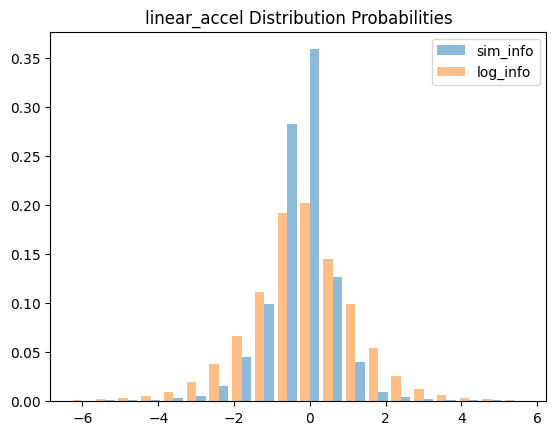

--------------------------------------------------

JS(linear_speed) = 0.035795494686644516


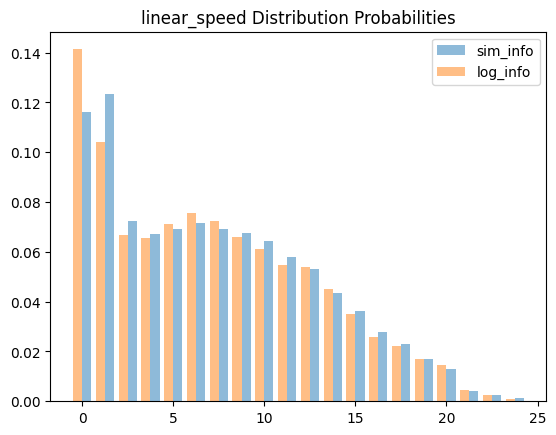

--------------------------------------------------

JS(yaw_speed) = 0.1181172601369204


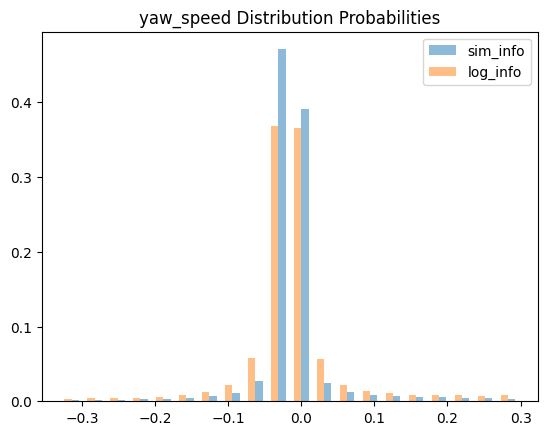

--------------------------------------------------

JS(yaw_accel) = 0.2106773927369614


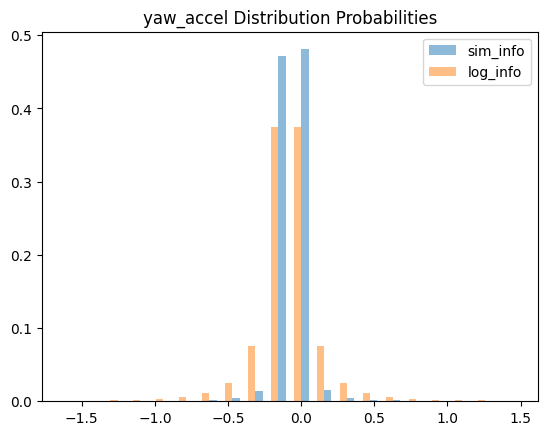

--------------------------------------------------

JS(relative_distance) = 0.06244707660803336


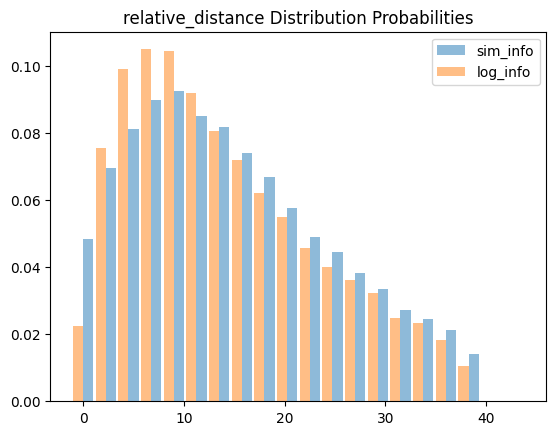

--------------------------------------------------

JS(relative_speed) = 0.05814496469127899


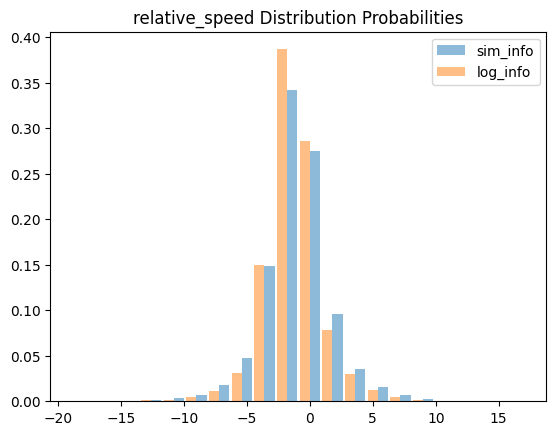

--------------------------------------------------

JS(relative_accel) = 0.26449422812699314


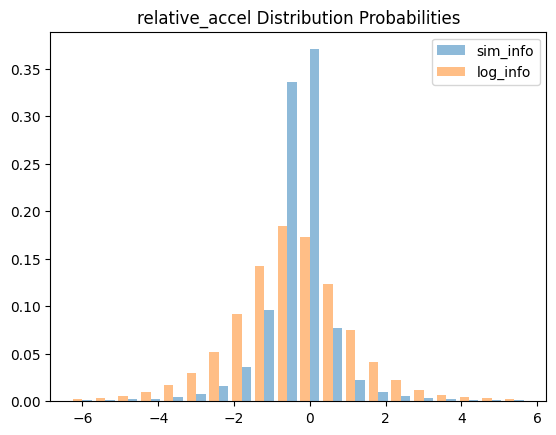

--------------------------------------------------

JS(ttc) = 0.12310937399270495


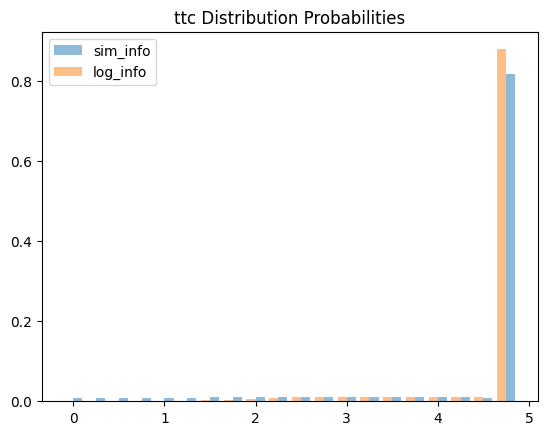

--------------------------------------------------



In [2]:
js_divergence_histogram = {}

for field in log_field_features.keys():
    log_field_feature = np.array(log_field_features[field])
    sim_field_feature = np.array(sim_field_features[field])
    js_divergence_histogram[field] = obj.cal_JS_with_histogram(field, log_field_feature, sim_field_feature, plot=True)

In [2]:
import os
import dataclasses
import tensorflow_probability as tfp
import matplotlib.pyplot as plt  
from scipy.spatial.distance import jensenshannon
from scipy.stats import entropy
from sklearn.neighbors import KernelDensity
import tensorflow as tf
import numpy as np
import pickle

In [3]:
config = {
    'linear_speed': {
        'min_val': 0.0,
        'max_val': 25.0,
        'num_bins': 10,
        'bar_width': 1,
    },
    'linear_accel': {
        'min_val': -12.0,
        'max_val': 12.0,
        'num_bins': 11,
        'bar_width': 1,
    },
    'yaw_speed': {
        'min_val': -0.628000020980835,
        'max_val': 0.628000020980835,
        'num_bins': 11,
        'bar_width': 0.05,
    },
    'yaw_accel': {
        'min_val': -3.140000104904175,
        'max_val': 3.140000104904175,
        'num_bins': 11,
        'bar_width': 0.2,
    },
    'relative_distance': {
        'min_val': 0.0,
        'max_val': 50.0,
        'num_bins': 10,
        'bar_width': 2,
    },
    'relative_speed': {
        'min_val': -25.0,
        'max_val': 25.0,
        'num_bins': 20,
        'bar_width': 1,
    },
    'relative_accel': {
        'min_val': -12.0,
        'max_val': 12.0,
        'num_bins': 11,
        'bar_width': 1,
    },
    'ttc': {
        'min_val': 0.0,
        'max_val': 5.0,
        'num_bins': 10,
        'bar_width': 0.2,
    },
}

In [4]:
from sklearn.neighbors import KernelDensity

def _KDE_density(feature, min_val, max_val):
    eps = 1e-6
    h_bandwidth = 1.06 * np.std(feature) * feature.shape[0] ** (-1/5)
    kde = KernelDensity(
        kernel="gaussian", 
        bandwidth=h_bandwidth, 
        algorithm="auto"
    ).fit(feature[:, tf.newaxis] + eps)
    x_ax = np.linspace(min_val, max_val, 100).reshape(-1, 1)
    log_density = kde.score_samples(x_ax).reshape(-1, 1)
    density_results = np.exp(log_density).reshape(-1, 1)
    return x_ax, density_results

In [5]:
from scipy.spatial.distance import jensenshannon
from scipy.stats import entropy
import matplotlib.pyplot as plt  

def cal_JS_with_kernal(field, log_feature, sim_feature, *, plot=False):
    log_feature = tf.clip_by_value(
        log_feature, config[field]['min_val'], config[field]['max_val'])
    sim_feature = tf.clip_by_value(
        sim_feature, config[field]['min_val'], config[field]['max_val'])
    
    x_a_preds, ds_preds = _KDE_density(sim_feature, config[field]['min_val'], config[field]['max_val'])
    x_a_log, ds_log = _KDE_density(log_feature, config[field]['min_val'], config[field]['max_val'])

    m = (ds_preds + ds_log) / 2.0
    
    KL_preds_m = entropy(ds_preds, m)
    KL_log_m = entropy(ds_log, m)

    js_divergence = ((KL_log_m + KL_preds_m) / 2.0)[0]

    if plot:
        print(f"JS({field}) = {js_divergence}") 
        plt.plot(x_a_preds.ravel(), ds_preds.ravel(), label="sim_info")  
        plt.fill_between(x_a_preds.ravel(), ds_preds.ravel(), alpha=0.5)  
        plt.plot(x_a_log.ravel(), ds_log.ravel(), label="log_info")  
        plt.fill_between(x_a_log.ravel(), ds_log.ravel(), alpha=0.5)  

        plt.title(f"{field} Kernel Density Estimate")
        plt.legend()
        plt.show()
        print("-" * 50 + '\n') 
    
    return js_divergence

JS(linear_accel) = 0.03390133008963018


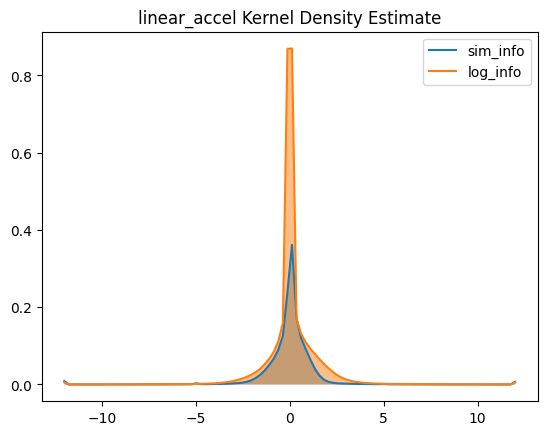

--------------------------------------------------

JS(linear_speed) = 0.0334913619554845


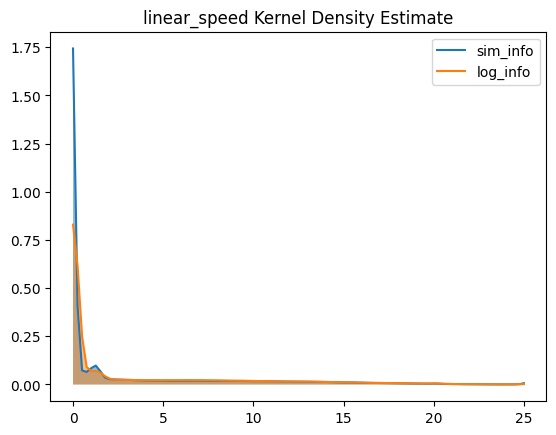

--------------------------------------------------

JS(yaw_speed) = 0.03140011324044483


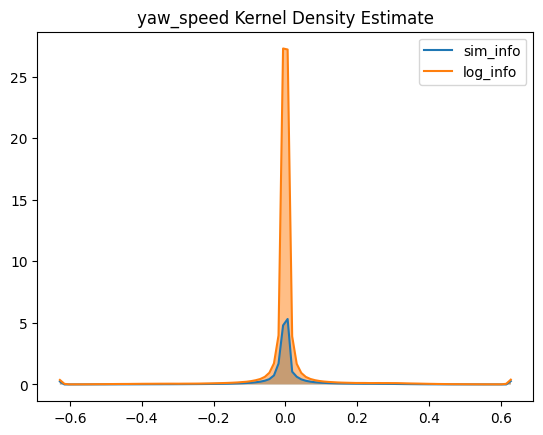

--------------------------------------------------

JS(yaw_accel) = 0.026022130233079144


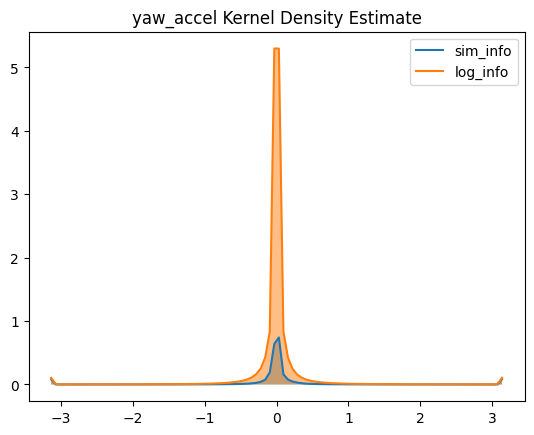

--------------------------------------------------

JS(relative_distance) = 0.10330628914030573


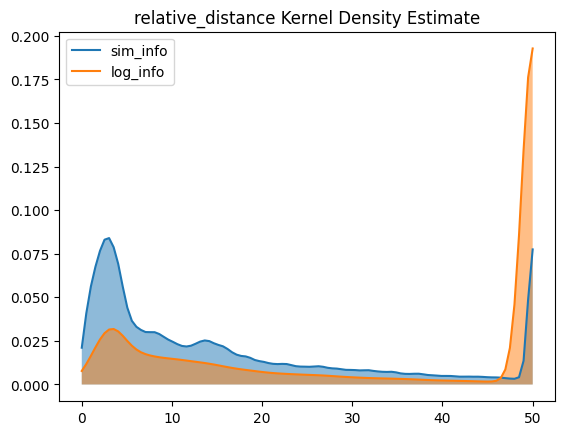

--------------------------------------------------

JS(relative_speed) = 0.018697150669373348


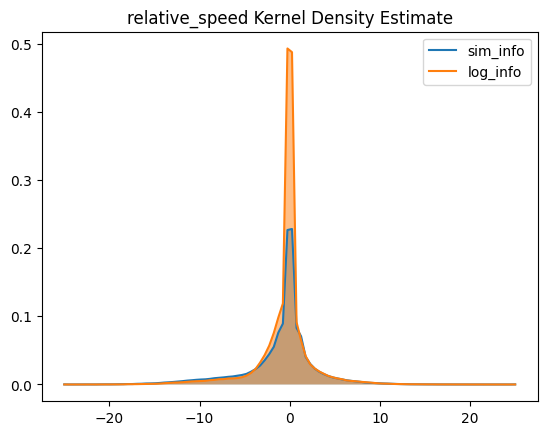

--------------------------------------------------

JS(relative_accel) = 0.019191708256195802


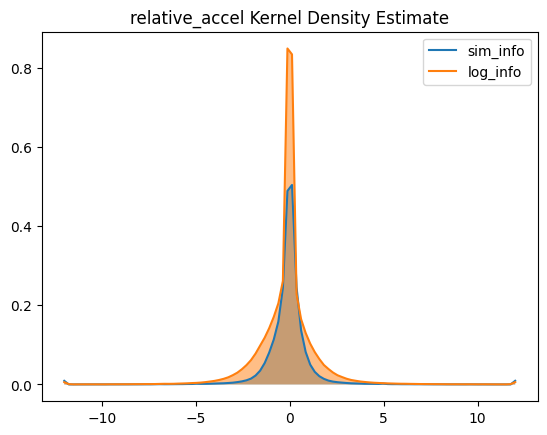

--------------------------------------------------

JS(ttc) = 0.021976919740656416


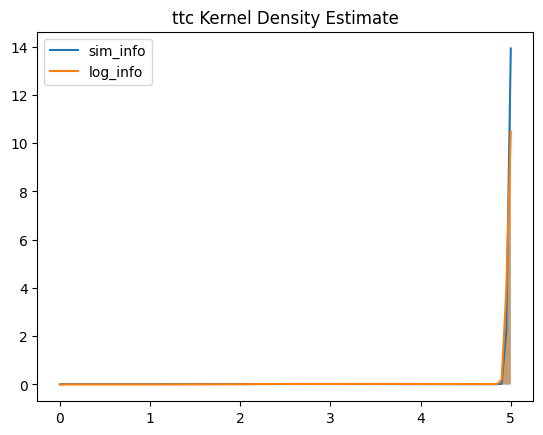

--------------------------------------------------



In [6]:
js_divergence_kernel = {}

for field in log_field_features.keys():
    log_field_feature = log_field_features[field]
    sim_field_feature = sim_field_features[field]
    js_divergence_kernel[field] = cal_JS_with_kernal(field, log_field_feature, sim_field_feature, plot=True)

## 批量运行拆解

In [3]:
import os 
import sys
src_path = os.path.join(os.getcwd(), 'src')
if src_path not in sys.path:
    sys.path.append(src_path)
from data_modules.data_h5_womd import DataH5womd
import pl_modules.waymo_motion as waymo_motion_module
from utils.transform_utils import torch_pos2global, torch_rad2rot, torch_rad2global
from models.metrics.custom_metrics import RealMetrics
from utils.real_features import compute_real_metric_features

import torch
import pickle
import tensorflow as tf
from waymo_open_dataset.protos import scenario_pb2
from waymo_open_dataset.utils import trajectory_utils

CKPG_NAME = "2cti1q5z"
CKPG_VER = "v41"
# CKPG_NAME = "285yb3yb"
# CKPG_VER = "v59"
HOME_DIR = "/home/gz0779601/codes/DataDriven_BehaviourModels/deep_learning_model/v1.0"
PKL_DIR = f"{HOME_DIR}/outputs/real_metrics_{CKPG_NAME}_{CKPG_VER}"
ROLLOUT_DIR = f"{HOME_DIR}/outputs/rollout_{CKPG_NAME}_{CKPG_VER}"

In [4]:
# 加载数据集
single_data = DataH5womd(
    data_dir = f"{HOME_DIR}/data/h5_womd_sim_agent",
    filename_train = "training",
    filename_val = "validation",
    filename_test = "testing",
    n_agent = 64,
    batch_size = 4,
    num_workers = 4,
)
single_data.setup(stage="validate")
val_dataloader = single_data.val_dataloader()

# 加载训练后的模型
ckpt_path = f"{HOME_DIR}/checkpoints/{CKPG_NAME}_{CKPG_VER}.ckpt"

checkpoint_version = f"yangyh408/traffic_bots/{CKPG_NAME}:{CKPG_VER}"
model = waymo_motion_module.WaymoMotion.load_from_checkpoint(
    ckpt_path, wb_artifact=checkpoint_version
)


2024-07-24 15:53:57.230632: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-24 15:53:57.231084: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-24 15:53:57.231193: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [5]:
for batch_idx, batch in enumerate(val_dataloader):
    if batch_idx == 1:
        batch["scenario_bytes"] = []
        for scene_idx in batch['episode_idx']:
            with open(rf"{HOME_DIR}/data/h5_wosac/val_scenarios/{scene_idx}.pickle", "rb") as handle:
                batch["scenario_bytes"].append(pickle.load(handle).hex())
        
        model.eval()
        with torch.no_grad():
            rollout = model.manual_joint_future_pred(batch=batch, batch_idx=batch_idx)
        break
        

In [6]:
# 转换为全局坐标系
trajs = rollout.preds.permute(0, 2, 1, 3, 4)

scenario_center = batch["scenario_center"].unsqueeze(1)  # [n_sc, 1, 2]
scenario_rot = torch_rad2rot(batch["scenario_yaw"])  # [n_sc, 2, 2]

pos_sim, yaw_sim = trajs[..., :2], trajs[..., 2:3]  # [n_sc, n_joint_future, n_ag, n_step_future, 2/1]
pos_sim = torch_pos2global(pos_sim.flatten(1, 3), scenario_center, scenario_rot).view(pos_sim.shape)
yaw_sim = torch_rad2global(yaw_sim.flatten(1, 4), batch["scenario_yaw"]).view(yaw_sim.shape)
agent_size = batch['agent/size'][..., :2]

In [7]:
si = 1

In [8]:
# 筛选车辆
real_metrics = RealMetrics()

mask_evaluated_agent = tf.logical_and(
    tf.reduce_sum(tf.cast(rollout.valid[si, :, 0, :], tf.int32), axis=-1) > 10,
    
    # 根据总坐标偏移量进行掩码：处理从中间帧加入的车可能有问题
    # tf.reduce_sum(
    #     tf.where(
    #         rollout.valid[si, :, 0, 1:], 
    #         tf.reduce_sum((rollout.preds[si, :, 0, 1:, :2] - rollout.preds[si, :, 0, :-1, :2]) ** 2, axis=-1), 
    #         0
    #     ),
    #     axis=-1
    # ) > 1,

    # 根据总速度进行掩码
    tf.reduce_sum(tf.abs(rollout.preds[si, :, 0, :, -1]), axis=-1) > 90
)
agent_filter = tf.range(rollout.valid[si, :, 0, :].shape[0])[mask_evaluated_agent].numpy()
object_id = batch['agent/object_id'][si][agent_filter]

# 计算回放轨迹的真实指标特征
origin_scenario = scenario_pb2.Scenario.FromString(bytes.fromhex(batch['scenario_bytes'][si]))
logged_trajectories = trajectory_utils.ObjectTrajectories.from_scenario(origin_scenario)
logged_trajectories = logged_trajectories.gather_objects_by_id(object_id)
logged_trajectories = logged_trajectories.slice_time(start_index=1)

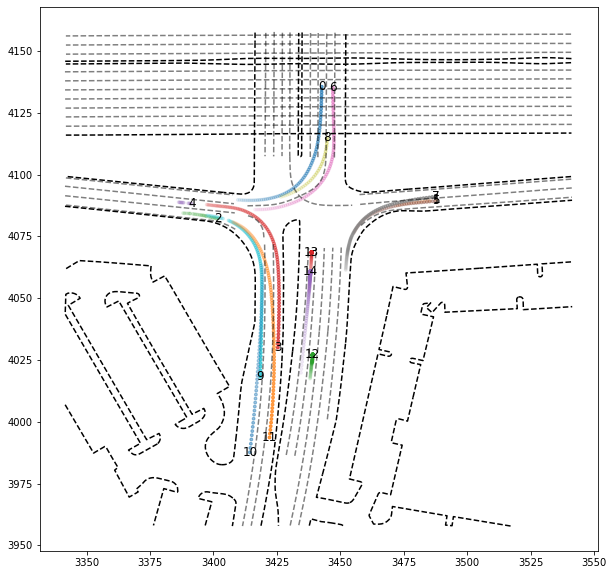

In [9]:
# 筛选后的轨迹可视化
import numpy as np
import matplotlib.pyplot as plt
from waymo_open_dataset.utils.sim_agents import visualizations

scenario = scenario_pb2.Scenario.FromString(bytes.fromhex(batch['scenario_bytes'][si]))
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
visualizations.add_map(ax, scenario)

alpha_values = np.linspace(0.1, 0.8, 90)  
for i in range(object_id.shape[0]):
    
    plt.scatter(logged_trajectories.x[i, :][logged_trajectories.valid[i, :]], 
                logged_trajectories.y[i, :][logged_trajectories.valid[i, :]],
                s=8, marker='o', alpha=alpha_values)  
    plt.text(logged_trajectories.x[i, :][logged_trajectories.valid[i, :]][-1], 
             logged_trajectories.y[i, :][logged_trajectories.valid[i, :]][-1],
            str(i), ha='center', va='center', fontsize=12, color='black')
plt.show()

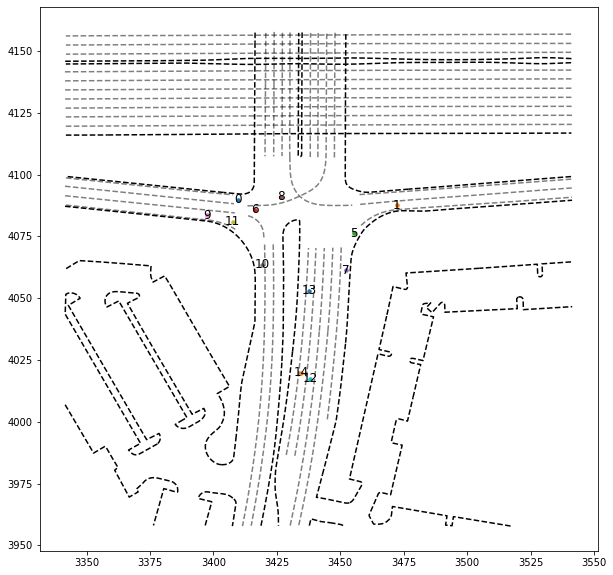

In [11]:
# 筛选后的轨迹可视化
import numpy as np
import matplotlib.pyplot as plt
from waymo_open_dataset.utils.sim_agents import visualizations

scenario = scenario_pb2.Scenario.FromString(bytes.fromhex(batch['scenario_bytes'][si]))
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
visualizations.add_map(ax, scenario)

frame_num = 0

for i in range(object_id.shape[0]):
    if logged_trajectories.valid[i, frame_num]:
        plt.scatter(logged_trajectories.x[i, frame_num], 
                    logged_trajectories.y[i, frame_num],
                    s=12, marker='o')  
        plt.text(logged_trajectories.x[i, frame_num], 
                    logged_trajectories.y[i, frame_num],
            str(i), ha='center', va='center', fontsize=12, color='black')
plt.show()

JS(linear_accel) = 0.2888837467835341


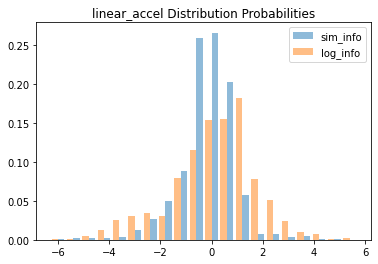

--------------------------------------------------

JS(linear_speed) = 0.1510714071415342


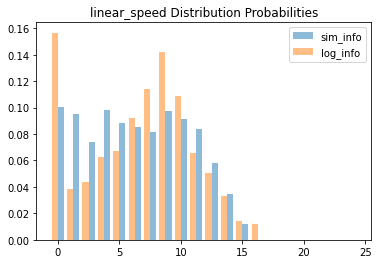

--------------------------------------------------

JS(yaw_speed) = 0.1885521692614016


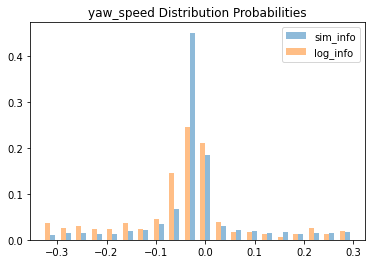

--------------------------------------------------

JS(yaw_accel) = 0.20741488342570996


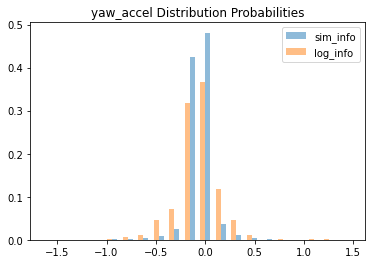

--------------------------------------------------

JS(relative_distance) = 0.23778109354371724


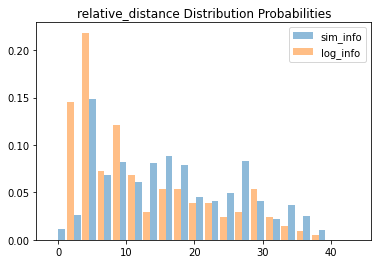

--------------------------------------------------

JS(relative_speed) = 0.2435300898730511


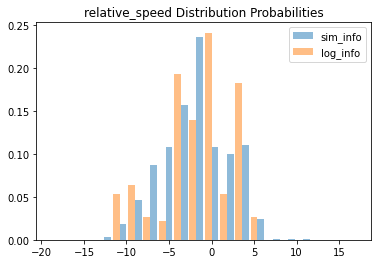

--------------------------------------------------

JS(relative_accel) = 0.15347777620778882


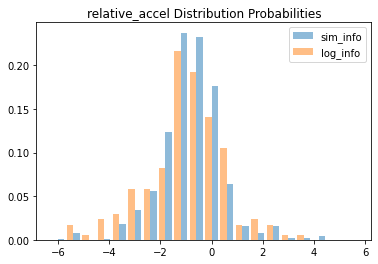

--------------------------------------------------

JS(ttc) = 0.21848613287679525


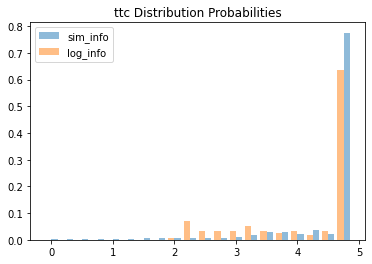

--------------------------------------------------



In [13]:
real_metrics.add_log_features(compute_real_metric_features(
    logged_trajectories.x, 
    logged_trajectories.y, 
    logged_trajectories.length, 
    logged_trajectories.width, 
    logged_trajectories.heading, 
    logged_trajectories.valid
))

# 计算每一个仿真rollout的真实指标特征
length = tf.repeat(agent_size[si, agent_filter, 0, tf.newaxis], trajs.shape[-2], axis=-1)
width = tf.repeat(agent_size[si, agent_filter, 1, tf.newaxis], trajs.shape[-2], axis=-1)
for ri in range(trajs.shape[1]):
    center_x = pos_sim[si, ri, agent_filter, :, 0]
    center_y = pos_sim[si, ri, agent_filter, :, 1]
    heading = yaw_sim[si, ri, agent_filter, :, 0]
    valid = rollout.valid[si, agent_filter, ri, :]
    
    real_metrics.add_sim_features(
        compute_real_metric_features(center_x, center_y, length, width, heading, valid))
    
real_metrics.compute_js_divergence(method='histogram', plot=True)
# 保存单场景真实性指标
# real_metrics.save(os.path.join(PKL_DIR, f"scene_{batch['episode_idx'][si]}.pkl"))

## 计算WOSAC指标

### 将结果保存到pkl文件

In [ ]:
output_dir = f"outputs/wosac_metric_{CKPG_NAME}_{CKPG_VER}"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

config = model.wosac_metrics.load_metrics_config()

for batch_idx, batch in enumerate(val_dataloader):
    skip_sign = True
    batch["scenario_bytes"] = []
    for scene_idx in batch['episode_idx']:
        output_path = f"{output_dir}/scene_{scene_idx}.pkl"
        with open(rf"data/h5_wosac/val_scenarios/{scene_idx}.pickle", "rb") as handle:
            batch["scenario_bytes"].append(pickle.load(handle).hex())
        if not os.path.exists(output_path):
            skip_sign = False
    
    if not skip_sign:
        # 使用 LightningModule 的 validation_step 进行单 batch 验证
        try:
            model.eval()
            with torch.no_grad():
                rollout = model.manual_joint_future_pred(batch=batch, batch_idx=batch_idx)

            wosac_data = model.wosac_post_processing(batch, rollout)
            scenario_rollouts = model.wosac_post_processing.get_scenario_rollouts(wosac_data)
            # model.wosac_metrics.update(scenario_rollouts, batch["scenario_bytes"])
            
            for i, scene_idx in enumerate(batch['episode_idx']):
                scenario_metrics = model.wosac_metrics._compute_scenario_metrics(
                    config, 
                    batch["scenario_bytes"][i],
                    scenario_rollouts[i]
                )
                with open(f"{output_dir}/scene_{scene_idx}.pkl", 'wb') as f:  
                    pickle.dump(scenario_metrics, f)
                    
        except Exception as e:
            print(f"Generate Failed in batch {batch_idx} with error {repr(e)}!")

### 加载pkl文件

In [ ]:
OUTPUT_DIR = f"outputs/wosac_metric_{CKPG_NAME}_{CKPG_VER}"
SCENE_NUM = 5

# 单独提取一个场景的指标信息
with open(f"{OUTPUT_DIR}/scene_{SCENE_NUM}.pkl", 'rb') as f:
    scene_metrics = pickle.load(f)
    print(scene_metrics)

### 批量分析pkl文件

In [ ]:
import pickle
import numpy as np
from pathlib import Path

OUTPUT_DIR = f"outputs/wosac_metric_{CKPG_NAME}_{CKPG_VER}"

fields_info = {
    "metametric": [],
    "average_displacement_error": [],
    "linear_speed_likelihood": [],
    "linear_acceleration_likelihood": [],
    "angular_speed_likelihood": [],
    "angular_acceleration_likelihood": [],
    "distance_to_nearest_object_likelihood": [],
    "collision_indication_likelihood": [],
    "time_to_collision_likelihood": [],
    "distance_to_road_edge_likelihood": [],
    "offroad_indication_likelihood": [],
    "min_average_displacement_error": [],
}

for file in Path(OUTPUT_DIR).glob('*'):
    # 读取pickle文件
    with open(file, 'rb') as f:
        scene_metrics = pickle.load(f)
    # 获取每个指标的得分并更新最高得分情况
    for field in fields_info.keys():
        fields_info[field].append(getattr(scene_metrics, field))

for k, v in fields_info.items():
    print(k, np.array(v).mean())